In [1]:
from google.colab import files
import os
import shutil

### Important Libraries Used
1- Data Manipulation and Analysis:

pandas (pd): Used for managing tabular data.
numpy (np): Used for numerical computations and operations on arrays and matrices.
xarray (xr): Specialized for multi-dimensional data (e.g., climate data) often with labels. Useful for large, labeled datasets like NetCDF files.

2- Data Visualization:

matplotlib (plt), seaborn (sns): Plotting and data visualization tools. Seaborn is used for more complex plots, e.g., heatmaps, while matplotlib offers more general plotting capabilities.

3- Machine Learning:

Scikit-Learn (train_test_split, LinearRegression, mean_squared_error, r2_score):
Used for splitting the dataset, training a linear regression model, and evaluating the performance using RMSE and R².
PyTorch (torch, torch.nn, etc.): Includes tools to create and train deep learning models. torch.utils.data facilitates data handling during training.
Deep Learning Models (PyTorch):

torch.nn.functional (F): Contains activation functions like ReLU.
DataLoader, SubsetRa


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import networkx as nx
import random
from scipy.spatial import distance
import xarray as xr
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, SubsetRandomSampler,TensorDataset
from torch.utils.data import Dataset
from torchvision import transforms
import matplotlib.pyplot as plt
from datetime import timedelta
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import seaborn as sns
import torch.optim as optim


In [3]:
# !pip install store

In [4]:
# !pip install xarray[complete]

In [5]:
# uploaded = files.upload()
# dest_path = "/content/data/"
# os.makedirs(os.path.dirname(dest_path), exist_ok=True)
# #shutil.move("/content/netflix_titles.xlsx", dest_path)
# shutil.rmtree("/content/sample_data/", ignore_errors=True, onerror=None)

## Input
Dataset (era5_data_6hours.nc):
Loaded using xarray, this is a NetCDF file containing environmental data, typically used in weather forecasting or climate studies.
Variables Extracted:
t2m, sp, skt, u10, v10, tp, ssr, str, etc., which represent temperature, pressure, wind speed, soil moisture, etc.
These variables were chosen because they are commonly used in weather models, and are relevant for understanding atmospheric and surface conditions.

## Output
Filtered Dataset:

Created by selecting only relevant variables from the dataset to limit processing to only the necessary information for the specific analysis.
Outputted in the form of a dataframe (df_filtered).
Visualizations:

Heatmaps for each variable showing spatial distribution over a grid (latitude x longitude).
Temporal visualizations to show variable progression over time, such as predictions.
Scatter plots, residual distributions for understanding the performance of the linear regression model.
Model Training Output:

Predictions (y_pred_train, y_pred_val) from the linear regression model.
Performance metrics like Root Mean Square Error (RMSE) and R² score were computed to evaluate the model’s effectiveness.

In [6]:
try:
    ds = xr.open_dataset('/content/era5_data_6hours.nc', engine='netcdf4')
except FileNotFoundError:
    print("The file was not found. Please check the file path.")
    ds = None
except ValueError as e:
    print(f"An error occurred: {e}")
    ds = None

if ds is not None:
    # Further processing
    print("File loaded successfully.")


File loaded successfully.


### Extracted Variables:
The variables like t2m, sp, skt and the rest, were chosen because they play a significant role in forecasting weather and analyzing environmental conditions.

t2m (2m temperature) is key for understanding surface temperature conditions.

Wind components (u10, v10) are essential for wind analysis.

tp (total precipitation) helps in analyzing rainfall patterns.

These are typically used as both inputs to forecast weather and as features to study relationships with target variables in climate models.

he 2m temperature (t2m) is a critical variable in weather analysis as it represents the temperature close to the earth's surface, which is important for forecasting and understanding climate conditions.
Your goal in this analysis was to predict t2m based on the other available variables (features) that describe atmospheric and surface conditions. the target because it is a key variable for surface weather analysis.

### Data Loading & Cleaning:

The dataset was loaded, and variables of interest were filtered using xarray and converted to pandas dataframe for easier manipulation.

### Exploratory Data Analysis (EDA):

Visualization of the spatial distribution using heatmaps provided insights into the geographic trends and correlations.
Normalization: Data normalization was done to bring all features to a similar scale, improving comparability and suitability for ML models.

### Machine Learning Analysis:

Linear Regression:
The input data (features) consisted of all variables except the target, t2m.
Splitting data into training and validation sets (train_test_split) allowed for model training and performance evaluation on unseen data.
Performance was evaluated using RMSE and R² scores, providing an understanding of how well the model can predict 2m temperature.
Predicted vs. True Values Scatter Plot: Used to visually assess the goodness of fit.

Residual Analysis: Analyzed the distribution of residuals, where ideally a normal distribution close to zero would indicate good performance.

In [7]:
if ds is not None:
    # Display dataset details
    print("Available data variables:", list(ds.data_vars))
    print("Dataset attributes:", ds.attrs)
    print("Coordinates:", ds.coords)

    # Extract relevant variables for weather forecasting
    variables = [
        't2m',  # 2m temperature
        'sp',  # Surface pressure
        'skt',  # Skin temperature
        'u10',  # 10m u-component of wind
        'v10',  # 10m v-component of wind
        'tp',  # Total precipitation
        'ssr',  # Surface net solar radiation
        'str',  # Surface net thermal radiation
        'stl1', 'stl2', 'stl3', 'stl4',  # Soil temperature levels 1-4
        'swvl1', 'swvl2', 'swvl3', 'swvl4',  # Volumetric soil water levels 1-4
        'tcc',  # Total cloud cover
        'e'  # Evaporation
    ]

    # Filter the dataset to keep only the required variables
    ds_filtered = ds[variables]
    print("Filtered dataset variables:", list(ds_filtered.data_vars))
else:
    print("Failed to load dataset. Please check the file path and format.")

Available data variables: ['u10', 'v10', 't2m', 'sp', 'tp', 'skt', 'ssr', 'str', 'tcc', 'e', 'stl1', 'stl2', 'stl3', 'stl4', 'swvl1', 'swvl2', 'swvl3', 'swvl4']
Dataset attributes: {'GRIB_centre': 'ecmf', 'GRIB_centreDescription': 'European Centre for Medium-Range Weather Forecasts', 'GRIB_subCentre': 0, 'Conventions': 'CF-1.7', 'institution': 'European Centre for Medium-Range Weather Forecasts', 'history': '2024-11-01T15:09 GRIB to CDM+CF via cfgrib-0.9.14.1/ecCodes-2.36.0 with {"source": "data.grib", "filter_by_keys": {"stream": ["oper"]}, "encode_cf": ["parameter", "time", "geography", "vertical"]}'}
Coordinates: Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 48B 2024-10-26T06:00:00 ... 2024-...
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    expver      (valid_time) <U4 96B ...
Filtered dataset variables: ['t2m', 'sp', 'skt', 'u10

In [8]:
# Display the first few rows of the filtered dataset as a DataFrame
df_filtered = ds_filtered.to_dataframe().reset_index()
print(df_filtered.head())

           valid_time  latitude  longitude         t2m            sp  \
0 2024-10-26 06:00:00      90.0       0.00  266.924255  99404.757812   
1 2024-10-26 06:00:00      90.0       0.25  266.924255  99404.757812   
2 2024-10-26 06:00:00      90.0       0.50  266.924255  99404.757812   
3 2024-10-26 06:00:00      90.0       0.75  266.924255  99404.757812   
4 2024-10-26 06:00:00      90.0       1.00  266.924255  99404.757812   

          skt       u10       v10        tp           ssr  ...       stl3  \
0  266.770386  4.444122  6.134109  0.000023  3.599999e-12  ...  267.84137   
1  266.770386  4.444122  6.134109  0.000023  3.599999e-12  ...  267.84137   
2  266.770386  4.444122  6.134109  0.000023  3.599999e-12  ...  267.84137   
3  266.770386  4.444122  6.134109  0.000023  3.599999e-12  ...  267.84137   
4  266.770386  4.444122  6.134109  0.000023  3.599999e-12  ...  267.84137   

         stl4     swvl1     swvl2     swvl3  swvl4  tcc         e  number  \
0  266.683868 -0.000006  0.

In [9]:
ds

<xarray.Dataset> Size: 449MB
Dimensions:     (valid_time: 6, latitude: 721, longitude: 1440)
Coordinates:
    number      int64 8B 0
  * valid_time  (valid_time) datetime64[ns] 48B 2024-10-26T06:00:00 ... 2024-...
  * latitude    (latitude) float64 6kB 90.0 89.75 89.5 ... -89.5 -89.75 -90.0
  * longitude   (longitude) float64 12kB 0.0 0.25 0.5 0.75 ... 359.2 359.5 359.8
    expver      (valid_time) <U4 96B '0005' '0005' '0005' '0005' '0005' '0005'
Data variables: (12/18)
    u10         (valid_time, latitude, longitude) float32 25MB 4.444 ... 5.016
    v10         (valid_time, latitude, longitude) float32 25MB 6.134 ... -0.0...
    t2m         (valid_time, latitude, longitude) float32 25MB 266.9 ... 230.3
    sp          (valid_time, latitude, longitude) float32 25MB 9.94e+04 ... 6...
    tp          (valid_time, latitude, longitude) float32 25MB 2.289e-05 ... 0.0
    skt         (valid_time, latitude, longitude) float32 25MB 266.8 ... 229.6
    ...          ...
    stl3        (valid_time, latitude, longitude) float32 25MB 267.8 ... 224.6
    stl4        (valid_time, latitude, longitude) float32 25MB 266.7 ... 224.6
    swvl1       (valid_time, latitude, longitude) float32 25MB -6.024e-06 ......
    swvl2       (valid_time, latitude, longitude) float32 25MB 8.917e-06 ... ...
    swvl3       (valid_time, latitude, longitude) float32 25MB 3.87e-06 ... 0...
    swvl4       (valid_time, latitude, longitude) float32 25MB 0.0 ... 0.1602
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2024-11-01T15:09 GRIB to CDM+CF via cfgrib-0.9.1...

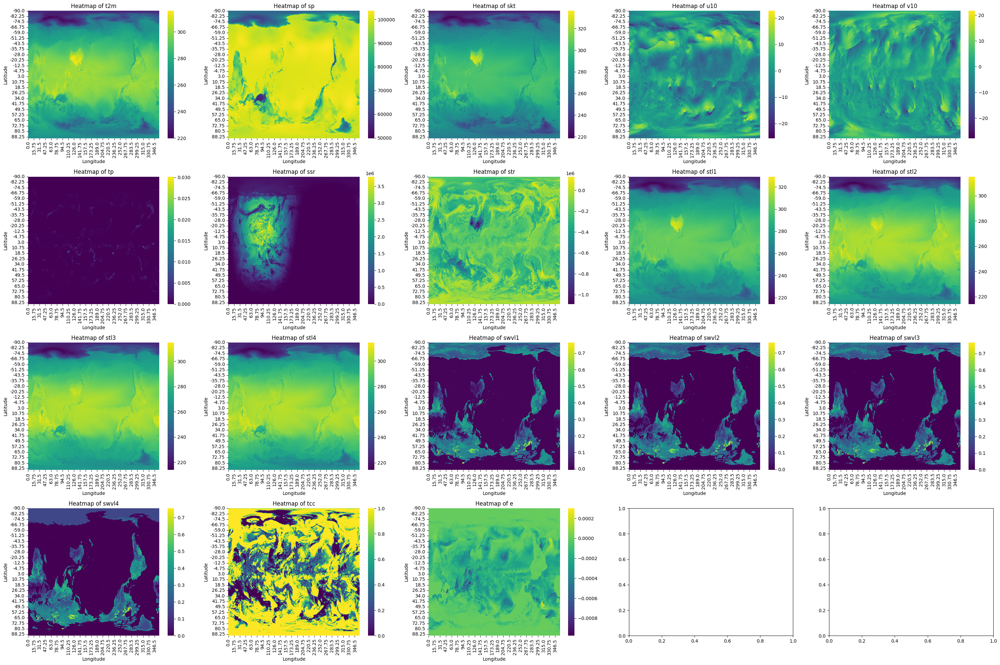

In [10]:
# Visualize input data using subplots
fig, axes = plt.subplots(4, 5, figsize=(30, 20))
axes = axes.flatten()
for idx, variable in enumerate(variables):
    if idx < len(axes):
        df_variable = df_filtered[['latitude', 'longitude', variable]].drop_duplicates(subset=['latitude', 'longitude'])
        df_pivot = df_variable.pivot(index='latitude', columns='longitude', values=variable)
        sns.heatmap(df_pivot, cmap='viridis', ax=axes[idx])
        axes[idx].set_title(f"Heatmap of {variable}")
        axes[idx].set_xlabel('Longitude')
        axes[idx].set_ylabel('Latitude')
plt.tight_layout()
plt.show()

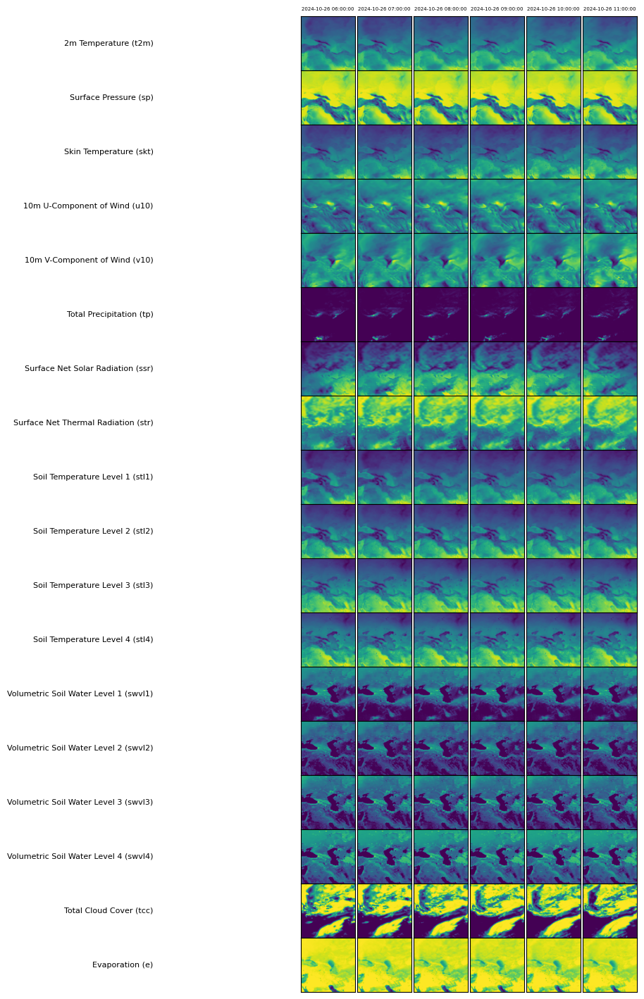

In [11]:
# Define the specific times you want to visualize within the 6-hour range
timestamps = [
    "2024-10-26 06:00:00",
    "2024-10-26 07:00:00",
    "2024-10-26 08:00:00",
    "2024-10-26 09:00:00",
    "2024-10-26 10:00:00",
    "2024-10-26 11:00:00",
]

# Create a figure with subplots to visualize each variable over time
num_variables = len(variables)
fig, axes = plt.subplots(num_variables, 6, figsize=(8, 1 * num_variables), gridspec_kw={'wspace': 0, 'hspace': 0})
fig.subplots_adjust(left=0.3)

for row, variable in enumerate(variables):
    for col, time in enumerate(timestamps):
        try:
            # Select data for the given variable and timestamp
            data_array = ds_filtered.sel(valid_time=time)[variable].isel(latitude=slice(128, 256), longitude=slice(128, 256))
            ax = axes[row, col] if num_variables > 1 else axes[col]
            im = ax.imshow(data_array.values, cmap='viridis', aspect='equal')
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            if row == 0:
                ax.set_title(time, fontsize=5)
        except KeyError:
            ax.set_title("No Data", fontsize=5)
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

# Add full variable names as labels next to each row of images
variable_names = [
    "2m Temperature (t2m)",
    "Surface Pressure (sp)",
    "Skin Temperature (skt)",
    "10m U-Component of Wind (u10)",
    "10m V-Component of Wind (v10)",
    "Total Precipitation (tp)",
    "Surface Net Solar Radiation (ssr)",
    "Surface Net Thermal Radiation (str)",
    "Soil Temperature Level 1 (stl1)",
    "Soil Temperature Level 2 (stl2)",
    "Soil Temperature Level 3 (stl3)",
    "Soil Temperature Level 4 (stl4)",
    "Volumetric Soil Water Level 1 (swvl1)",
    "Volumetric Soil Water Level 2 (swvl2)",
    "Volumetric Soil Water Level 3 (swvl3)",
    "Volumetric Soil Water Level 4 (swvl4)",
    "Total Cloud Cover (tcc)",
    "Evaporation (e)"
]

for row, variable_name in enumerate(variable_names):
    fig.text(0.04, (fig.subplotpars.top - fig.subplotpars.bottom) * (1 - (row + 0.5) / num_variables) + fig.subplotpars.bottom,
             variable_name, va='center', ha='right', fontsize=8)

plt.show()

In [14]:
# !pip install cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 13.4 MB/s eta 0:00:00


In [15]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_cultural/ne_50m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


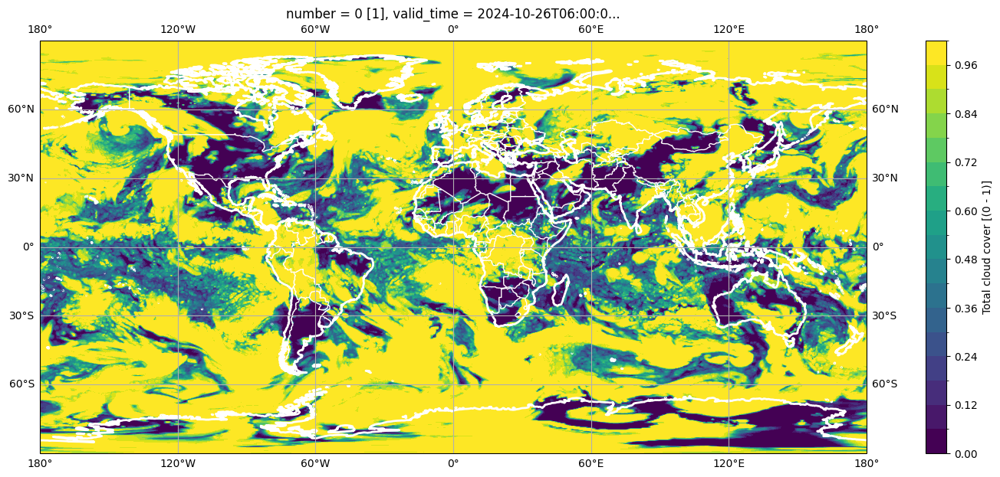

In [16]:
# Selecting one time step and plotting for tcc
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20, 7))
ax = plt.axes(projection=ccrs.PlateCarree())
ds["tcc"].isel(valid_time=0).plot.contourf(ax=ax, transform=ccrs.PlateCarree(), levels=20)
ax.coastlines(resolution='50m', color='white', linewidth=2)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor='white')
ax.gridlines(draw_labels=True)

plt.show()

In [17]:
ds["t2m"] = ds['t2m'] - 273.15  # Convert 't2m' from Kelvin to Celsius

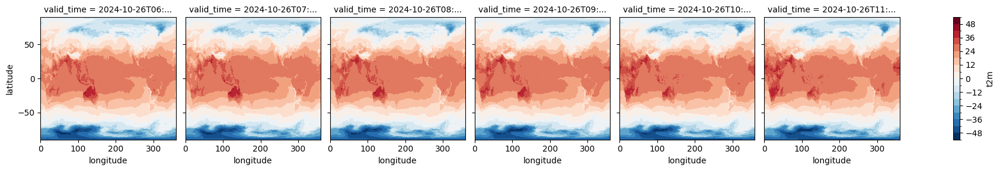

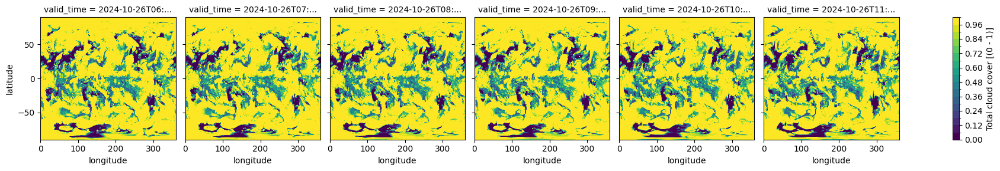

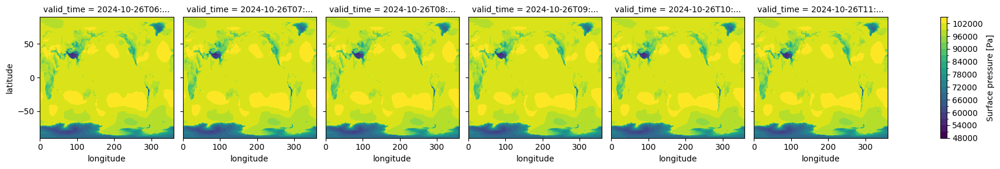

In [18]:
ds["t2m"].isel(valid_time=[0, 1, 2, 3, 4, 5]).plot.contourf(levels=20, col='valid_time', col_wrap=6)
ds["tcc"].isel(valid_time=[0, 1, 2, 3, 4, 5]).plot.contourf(levels=20, col='valid_time', col_wrap=6)
ds["sp"].isel(valid_time=[0, 1, 2, 3, 4, 5]).plot.contourf(levels=20, col='valid_time', col_wrap=6)

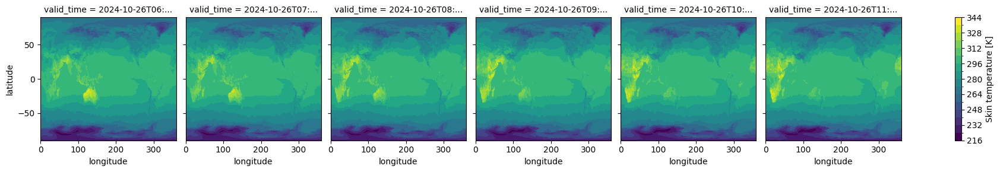

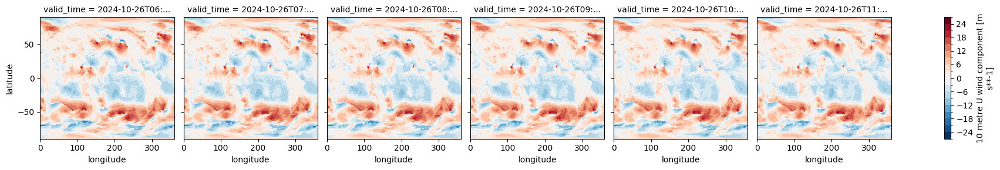

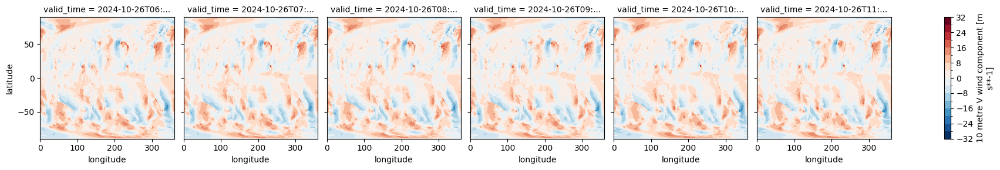

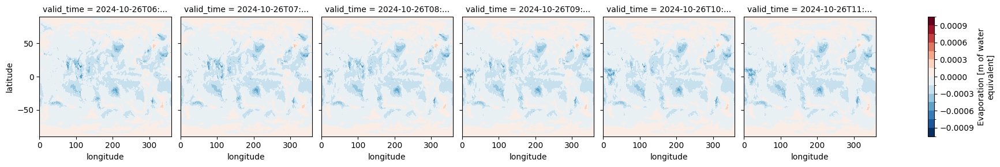

In [19]:
ds["skt"].isel(valid_time=[0, 1, 2, 3, 4, 5]).plot.contourf(levels=20, col='valid_time', col_wrap=6)
ds["u10"].isel(valid_time=[0, 1, 2, 3, 4, 5]).plot.contourf(levels=20, col='valid_time', col_wrap=6)
ds["v10"].isel(valid_time=[0, 1, 2, 3, 4, 5]).plot.contourf(levels=20, col='valid_time', col_wrap=6)
ds["e"].isel(valid_time=[0, 1, 2, 3, 4, 5]).plot.contourf(levels=20, col='valid_time', col_wrap=6)

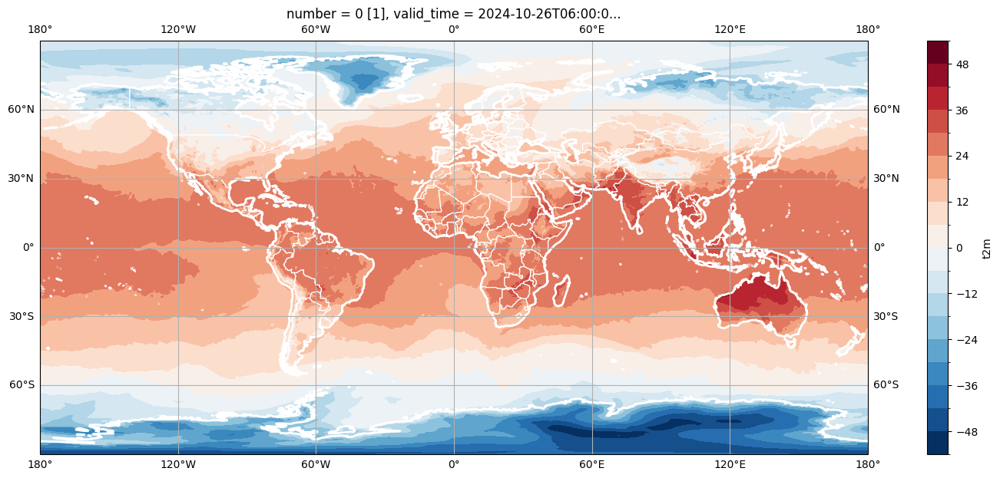

In [20]:
fig = plt.figure(figsize=(20, 7))
ax = plt.axes(projection=ccrs.PlateCarree())
ds["t2m"].isel(valid_time=0).plot.contourf(ax=ax, transform=ccrs.PlateCarree(), levels=20)
ax.coastlines(resolution='50m', color='white', linewidth=2)
ax.add_feature(cfeature.BORDERS.with_scale('50m'), edgecolor='white')
ax.gridlines(draw_labels=True)

plt.show()

In [21]:
# Normalize each variable to the range [0, 1]
df_normalized = df_filtered.copy()
for variable in variables:
    min_val = df_filtered[variable].min()
    max_val = df_filtered[variable].max()
    df_normalized[variable] = (df_filtered[variable] - min_val) / (max_val - min_val)

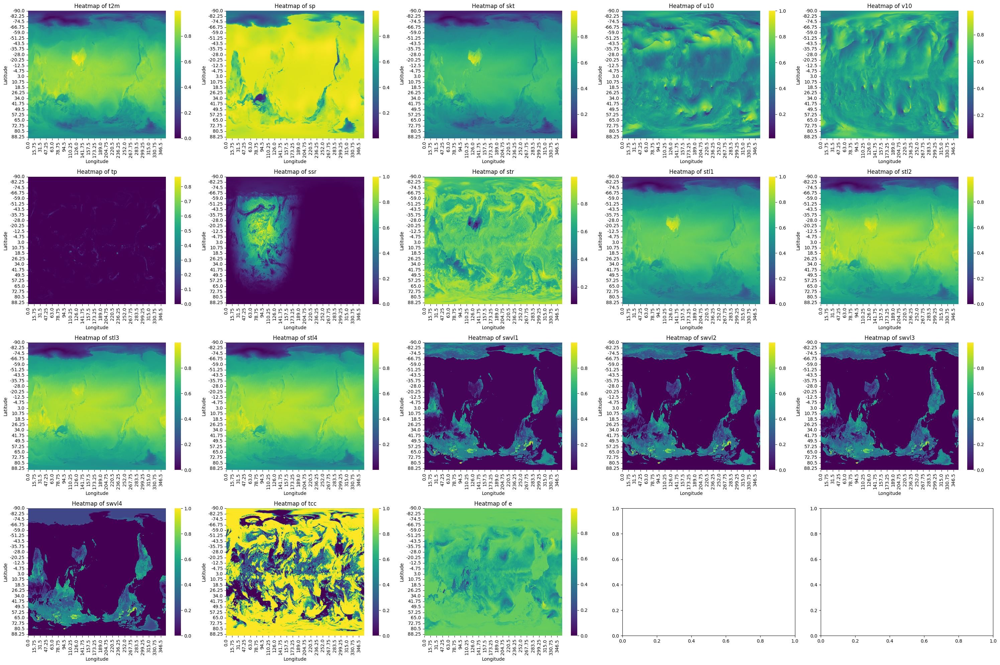

In [22]:
# Visualize normalized input data using subplots
fig, axes = plt.subplots(4, 5, figsize=(30, 20))
axes = axes.flatten()
for idx, variable in enumerate(variables):
    if idx < len(axes):
        df_variable = df_normalized[['latitude', 'longitude', variable]].drop_duplicates(subset=['latitude', 'longitude'])
        df_pivot = df_variable.pivot(index='latitude', columns='longitude', values=variable)
        sns.heatmap(df_pivot, cmap='viridis', ax=axes[idx])
        axes[idx].set_title(f"Heatmap of {variable}")
        axes[idx].set_xlabel('Longitude')
        axes[idx].set_ylabel('Latitude')
plt.tight_layout()
plt.show()

### Linear Regression

In [23]:

# Import xarray for multi-dimensional data
import xarray as xr
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [24]:
# Prepare the data for Linear Regression
target_variable = 't2m'
# # Convert 't2m' values from Kelvin to Celsius
# ds_filtered['t2m'] = ds_filtered['t2m'] - 273.15

features = [var for var in variables if var != target_variable]

X = df_filtered[features]
y = df_filtered[target_variable] #- 273.15 # Convert 't2m' values from Kelvin to Celsius

# Split into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the Linear Regression Model
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

LinearRegression()

In [25]:
# Make Predictions
y_pred_train = linear_model.predict(X_train)
y_pred_val = linear_model.predict(X_val)

# Evaluate the Model
train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
val_rmse = np.sqrt(mean_squared_error(y_val, y_pred_val))
r2 = r2_score(y_val, y_pred_val)

print(f"Training RMSE: {train_rmse:.4f}")
print(f"Validation RMSE: {val_rmse:.4f}")
print(f"R^2 Score: {r2:.4f}")

Training RMSE: 1.6686
Validation RMSE: 1.6658
R^2 Score: 0.9924


In [26]:
import matplotlib.pyplot as plt

# Example timestamps for visualizing predictions over the next 1 hours
next_1_hours = ["12:00:00", "12:05:00", "12:10:00",
                "12:15:00", "12:20:00", "12:25:00",
                "12:30:00", "12:35:00", "12:40:00",
                "12:45:00", "12:50:00", "12:55:00"]

# Assuming we have spatial predictions for each timestamp
predicted_values_spatial = [linear_model.predict(X_val[:128*128]).reshape((128, 128)) for _ in next_1_hours]

# # Create a figure with subplots to visualize the prediction progression over time
# fig, ax = plt.subplots(1, len(next_1_hours), figsize=(20, 8))
# fig.subplots_adjust(left=0.1)  # Adjust left margin to accommodate titles

# # Plot the spatial predictions for each timestamp

# for i, (time, prediction) in enumerate(zip(next_1_hours, predicted_values_spatial)):
#     ax[i].imshow(prediction, cmap='viridis')
#     ax[i].set_title(f"Pred {time}")
#     ax[i].get_xaxis().set_visible(False)
#     ax[i].get_yaxis().set_visible(False)

# fig.tight_layout()
# fig.subplots_adjust(wspace=0, hspace=0)

# plt.show()



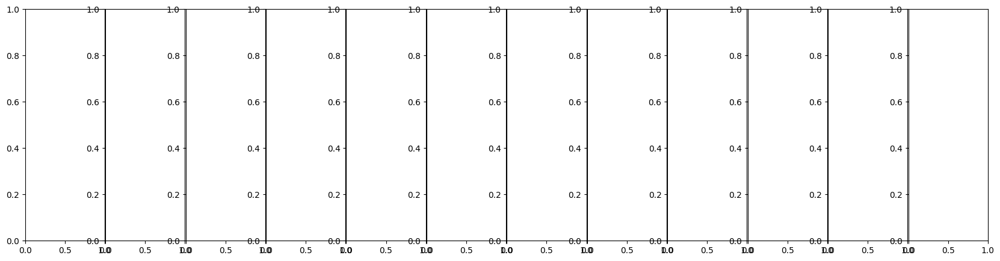

In [51]:

fig, axes = plt.subplots(1, len(next_1_hours), figsize=(20, 5))
fig.subplots_adjust(left=0.1, wspace=0.01)  # Adjust margins and spacing

# Set a shared colormap normalization for consistency across all heatmaps
vmin = np.min([np.min(pred) for pred in predicted_values_spatial])
vmax = np.max([np.max(pred) for pred in predicted_values_spatial])

# # Plotting each heatmap
# for i, (time, prediction) in enumerate(zip(next_1_hours, predicted_values_spatial)):
#     ax = axes[i]
#     sns.heatmap(prediction, cmap='viridis', ax=ax, cbar=False, square=True, vmin=vmin, vmax=vmax)  # Use a heatmap to visualize data
#     ax.set_title(f"Pred {time}", fontsize=10)
#     ax.axis('off')  # Hide axes for better clarity

# # Add a colorbar to the right of the figure for the entire set of predictions
# cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # Set position for colorbar
# cbar = plt.colorbar(plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
# cbar.set_label('Temperature (°C)', fontsize=12)  # Label for colorbar

# plt.show()


Predicted Values for 12:00:00:
[[229.7882  299.0156  279.76895 ... 280.6632  290.8078  292.50406]
 [288.89816 246.83737 268.42978 ... 259.9868  262.3714  266.56482]
 [278.0326  284.20145 276.46484 ... 273.9313  295.333   293.8405 ]
 ...
 [256.10065 279.24686 271.50912 ... 254.32974 281.2001  229.03883]
 [301.5527  278.39917 300.317   ... 232.2086  296.23465 272.16986]
 [277.83875 268.6628  295.16187 ... 254.79837 246.75664 273.68903]]
Max Temp: 322.40°C, Mean Temp: 279.88°C
Mean of Max and Mean Temp: 301.14°C
Predicted Values for 12:05:00:
[[229.7882  299.0156  279.76895 ... 280.6632  290.8078  292.50406]
 [288.89816 246.83737 268.42978 ... 259.9868  262.3714  266.56482]
 [278.0326  284.20145 276.46484 ... 273.9313  295.333   293.8405 ]
 ...
 [256.10065 279.24686 271.50912 ... 254.32974 281.2001  229.03883]
 [301.5527  278.39917 300.317   ... 232.2086  296.23465 272.16986]
 [277.83875 268.6628  295.16187 ... 254.79837 246.75664 273.68903]]
Max Temp: 322.40°C, Mean Temp: 279.88°C
Mean o

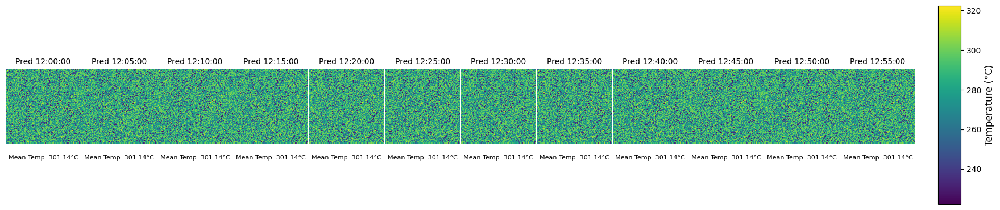

In [28]:
#to visualize with Temp

fig, axes = plt.subplots(1, len(next_1_hours), figsize=(20, 5))
fig.subplots_adjust(left=0.1, wspace=0.01)  # Adjust margins and spacing

# Set a shared colormap normalization for consistency across all heatmaps
vmin = np.min([np.min(pred) for pred in predicted_values_spatial])
vmax = np.max([np.max(pred) for pred in predicted_values_spatial])

# Plotting each heatmap and printing values
for i, (time, prediction) in enumerate(zip(next_1_hours, predicted_values_spatial)):
    # Calculate max, mean, and mean of max and mean
    max_temp = np.max(prediction)
    mean_temp = np.mean(prediction)
    mean_of_max_and_mean = (max_temp + mean_temp) / 2

    # Print prediction data to verify correctness
    print(f"Predicted Values for {time}:")
    print(prediction)
    print(f"Max Temp: {max_temp:.2f}°C, Mean Temp: {mean_temp:.2f}°C")
    print(f"Mean of Max and Mean Temp: {mean_of_max_and_mean:.2f}°C")

    # Plot heatmap
    ax = axes[i]
    sns.heatmap(prediction, cmap='viridis', ax=ax, cbar=False, square=True, vmin=vmin, vmax=vmax)
    ax.set_title(f"Pred {time}", fontsize=10)
    ax.axis('off')  # Hide axes for better clarity

    # Add values for max, mean, and mean of max and mean beneath each plot
    # ax.text(0.5, -0.15, f"Max Temp: {max_temp:.2f}°C", ha='center', va='top', transform=ax.transAxes, fontsize=8)
    # ax.text(0.5, -0.25, f"Mean Temp: {mean_temp:.2f}°C", ha='center', va='top', transform=ax.transAxes, fontsize=8)
    ax.text(0.5, -0.15, f"Mean Temp: {mean_of_max_and_mean:.2f}°C", ha='center', va='top', transform=ax.transAxes, fontsize=8)

# Add a colorbar to the right of the figure for the entire set of predictions
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # Set position for colorbar
cbar = plt.colorbar(plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=vmin, vmax=vmax)), cax=cbar_ax)
cbar.set_label('Temperature (°C)', fontsize=12)

plt.show()


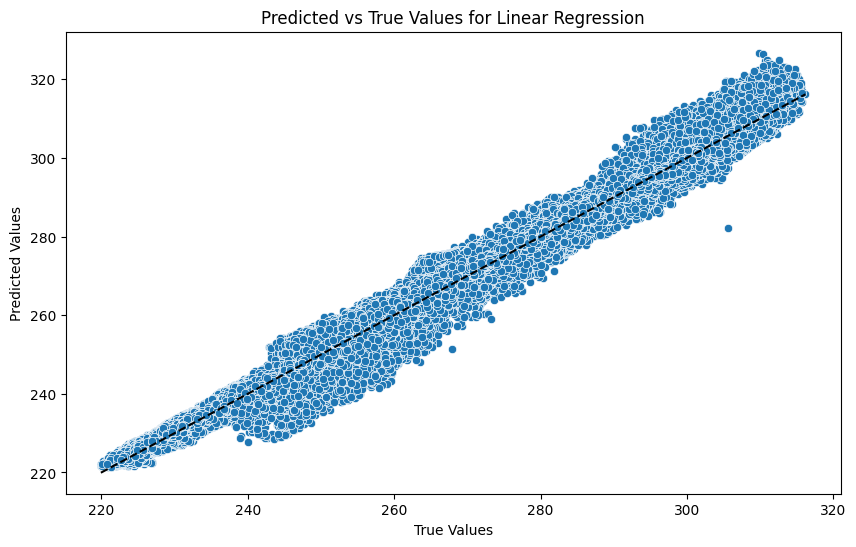

In [29]:
# Visualize Predictions vs True Values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_val, y=y_pred_val)
plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.plot([min(y_val), max(y_val)], [min(y_val), max(y_val)], 'k--')
plt.title("Predicted vs True Values for Linear Regression")
plt.show()


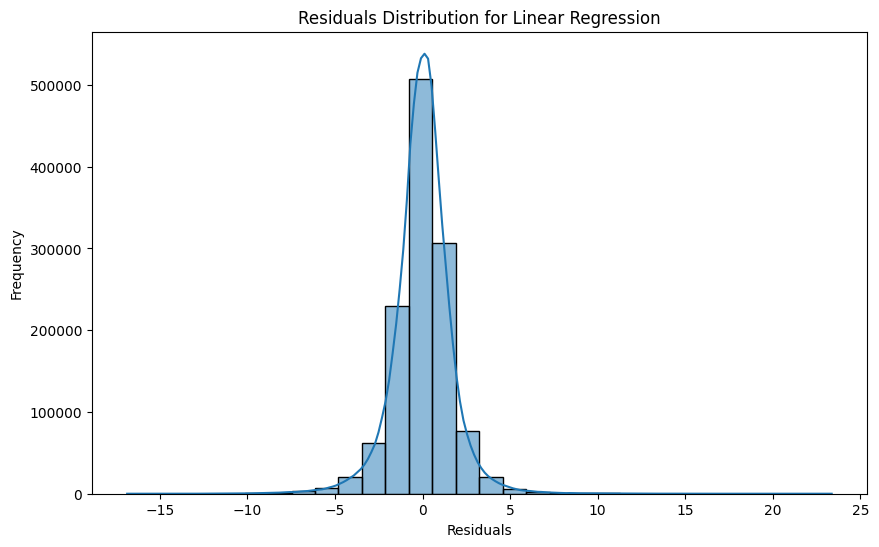

In [30]:
# Plot Residuals
residuals = y_val - y_pred_val
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, bins=30)
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.title("Residuals Distribution for Linear Regression")
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_stochastic_gradient.py:1616: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_stochastic_gradient.py:1616: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_stochastic_gradient.py:1616: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_stochastic_gradient.py:1616: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_stocha

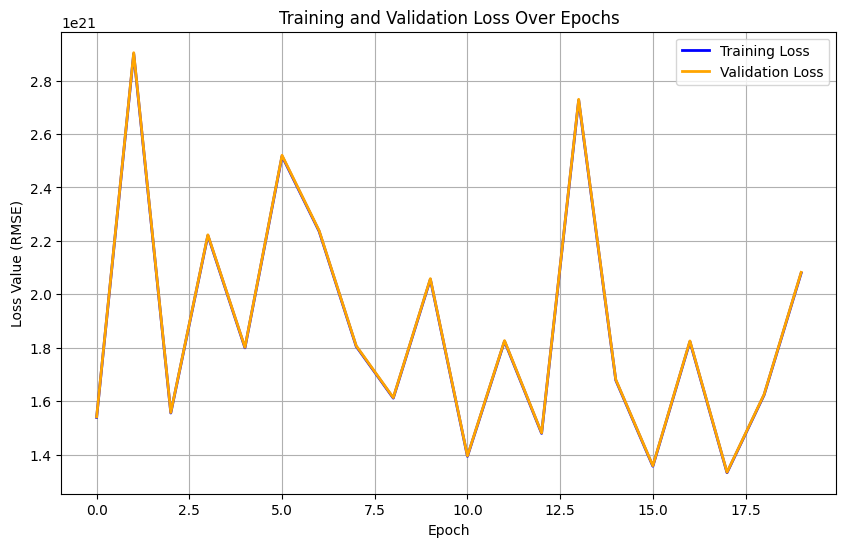

In [31]:
from sklearn.linear_model import SGDRegressor
from sklearn.metrics import mean_squared_error

# Convert training and validation sets to numpy arrays if needed
X_train_np, y_train_np = X_train.values, y_train.values
X_val_np, y_val_np = X_val.values, y_val.values

# Set number of epochs and learning rate
epochs = 20
learning_rate = 0.01

# Initialize the SGDRegressor model for iterative training
linear_model = SGDRegressor(max_iter=1, eta0=learning_rate, learning_rate='constant', random_state=42, warm_start=True)

# Lists to store loss values for each epoch
train_losses = []
val_losses = []

# Training loop for each epoch
for epoch in range(epochs):
    # Fit model on training data
    linear_model.fit(X_train_np, y_train_np)

    # Make predictions on training and validation sets
    y_pred_train = linear_model.predict(X_train_np)
    y_pred_val = linear_model.predict(X_val_np)

    # Calculate RMSE for training and validation sets
    train_loss = np.sqrt(mean_squared_error(y_train_np, y_pred_train))
    val_loss = np.sqrt(mean_squared_error(y_val_np, y_pred_val))

    # Store loss values
    train_losses.append(train_loss)
    val_losses.append(val_loss)

# Plot Training and Validation Loss
plt.figure(figsize=(10, 6))
plt.plot(range(epochs), train_losses, label='Training Loss', color='blue', linewidth=2)
plt.plot(range(epochs), val_losses, label='Validation Loss', color='orange', linewidth=2)
plt.legend(prop={'size': 10})
plt.xlabel('Epoch', size=10)
plt.ylabel('Loss Value (RMSE)', size=10)
plt.title('Training and Validation Loss Over Epochs', size=12)
plt.grid(True)
plt.show()


### CNN Convolutional Networks

In [32]:
# Convert normalized DataFrame back to xarray Dataset
ds_normalized = df_normalized.set_index(['latitude', 'longitude', 'valid_time']).to_xarray()
# Stack all variables along the last axis to create multi-channel input
data_arrays = [ds_normalized[var].values for var in variables]
data = np.stack(data_arrays, axis=-1)

In [33]:
# Reshape data to have a suitable shape for CNN input
lat_size = len(ds_normalized.latitude)
lon_size = len(ds_normalized.longitude)
time_steps = len(ds_normalized.valid_time)

if time_steps < 2:
    raise ValueError("Not enough data available for training. Please ensure there are at least two time steps available.")
# Reshape data dynamically
data = data.reshape((time_steps, lat_size, lon_size, len(variables)))
# Prepare Training and Validation Data
X = data[:-1]  # All but the last time step
y = data[1:, :, :, 0]  # All but the first time step, using temperature as the target
# Split into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [34]:
class WeatherCNNLSTM(nn.Module):
    def __init__(self, in_channels, num_classes):
        super(WeatherCNNLSTM, self).__init__()

        # CNN layers
        self.conv1 = nn.Conv2d(in_channels, 16, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Adaptive pooling to ensure consistent input size for LSTM
        self.adaptive_pool = nn.AdaptiveAvgPool2d((16, 16))

        # LSTM layers
        self.lstm = nn.LSTM(input_size=32 * 16 * 16, hidden_size=128, num_layers=2, batch_first=True)

        # Fully connected layer
        self.fc = nn.Linear(128, num_classes)

    def forward(self, x):
        batch_size, time_steps, channels, height, width = x.size()
        c_in = x.view(batch_size * time_steps, channels, height, width)

        # Pass through CNN layers
        c_out = F.relu(self.conv1(c_in))
        c_out = self.pool(F.relu(self.conv2(c_out)))

        # Apply adaptive pooling
        c_out = self.adaptive_pool(c_out)

        # Flatten for LSTM
        c_out = c_out.view(batch_size, time_steps, -1)

        # Pass through LSTM
        lstm_out, _ = self.lstm(c_out)

        # Fully connected layer
        output = self.fc(lstm_out[:, -1, :])  # Use the last time step's output
        return output


In [35]:
# Number of input variables/channels
in_channels = len(variables)
num_classes = 1  # For regression

# Instantiate the model
model = WeatherCNNLSTM(in_channels=in_channels, num_classes=num_classes)


In [36]:
# Define loss function and optimizer
criterion = nn.MSELoss()  # Mean Squared Error loss for regression
optimizer = optim.Adam(model.parameters(), lr=0.001)  # Adjusted learning rate

In [37]:
# Move the model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

WeatherCNNLSTM(
  (conv1): Conv2d(18, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (adaptive_pool): AdaptiveAvgPool2d(output_size=(16, 16))
  (lstm): LSTM(8192, 128, num_layers=2, batch_first=True)
  (fc): Linear(in_features=128, out_features=1, bias=True)
)

In [38]:
# Summary of the model
print(model)

WeatherCNNLSTM(
  (conv1): Conv2d(18, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (adaptive_pool): AdaptiveAvgPool2d(output_size=(16, 16))
  (lstm): LSTM(8192, 128, num_layers=2, batch_first=True)
  (fc): Linear(in_features=128, out_features=1, bias=True)
)


In [39]:
# Prepare data for training and validation
labels = data[:, 0, 0, 0]  # Assuming the first variable at a specific location is the target (e.g., temperature)
data_tensor = torch.tensor(data, dtype=torch.float32).permute(0, 3, 1, 2)  # Transpose to (batch_size, channels, height, width)
labels_tensor = torch.tensor(labels, dtype=torch.float32).unsqueeze(1)  # Add an extra dimension for labels


In [40]:
dataset = TensorDataset(data_tensor, labels_tensor)


In [41]:
# Split dataset into training and validation sets
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

In [42]:
# Create DataLoader for training and validation
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)  # Increased batch size to 16
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)  # Increased batch size to 16


In [43]:
print(f"Training dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")


Training dataset size: 4
Validation dataset size: 2


In [44]:
# Training loop
n_epochs = 20
train_losses = []
val_losses = []
for epoch in range(n_epochs):
    model.train()
    running_loss = 0.0
    for inputs, targets in train_loader:
        # Add an additional time dimension
        inputs = inputs.unsqueeze(1)  # Adds a time dimension (time_steps = 1)
        inputs, targets = inputs.to(device), targets.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)
        targets = targets.view(-1, 1)  # Ensure targets have the same shape as outputs
        loss = criterion(outputs, targets)

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)

    epoch_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_loss)

    # Validation
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for inputs, targets in val_loader:
            # Add an additional time dimension
            inputs = inputs.unsqueeze(1)  # Adds a time dimension (time_steps = 1)
            inputs, targets = inputs.to(device), targets.to(device)

            outputs = model(inputs)
            targets = targets.view(-1, 1)  # Ensure targets have the same shape as outputs
            loss = criterion(outputs, targets)
            val_loss += loss.item() * inputs.size(0)
    val_loss /= len(val_loader.dataset)
    val_losses.append(val_loss)
    print(f'Epoch {epoch + 1}/{n_epochs} - Training Loss: {train_losses[-1]:.4f} - Validation Loss: {val_losses[-1]:.4f}')

print('Training complete.')


Epoch 1/20 - Training Loss: 0.5931 - Validation Loss: 0.1117
Epoch 2/20 - Training Loss: 0.3731 - Validation Loss: 0.0535
Epoch 3/20 - Training Loss: 0.1911 - Validation Loss: 0.0631
Epoch 4/20 - Training Loss: 0.0727 - Validation Loss: 0.1448
Epoch 5/20 - Training Loss: 0.0248 - Validation Loss: 0.2763
Epoch 6/20 - Training Loss: 0.0358 - Validation Loss: 0.3543
Epoch 7/20 - Training Loss: 0.0565 - Validation Loss: 0.3613
Epoch 8/20 - Training Loss: 0.0572 - Validation Loss: 0.3315
Epoch 9/20 - Training Loss: 0.0469 - Validation Loss: 0.2902
Epoch 10/20 - Training Loss: 0.0359 - Validation Loss: 0.2481
Epoch 11/20 - Training Loss: 0.0277 - Validation Loss: 0.2098
Epoch 12/20 - Training Loss: 0.0237 - Validation Loss: 0.1789
Epoch 13/20 - Training Loss: 0.0237 - Validation Loss: 0.1564
Epoch 14/20 - Training Loss: 0.0263 - Validation Loss: 0.1422
Epoch 15/20 - Training Loss: 0.0293 - Validation Loss: 0.1352
Epoch 16/20 - Training Loss: 0.0313 - Validation Loss: 0.1337
Epoch 17/20 - Tra

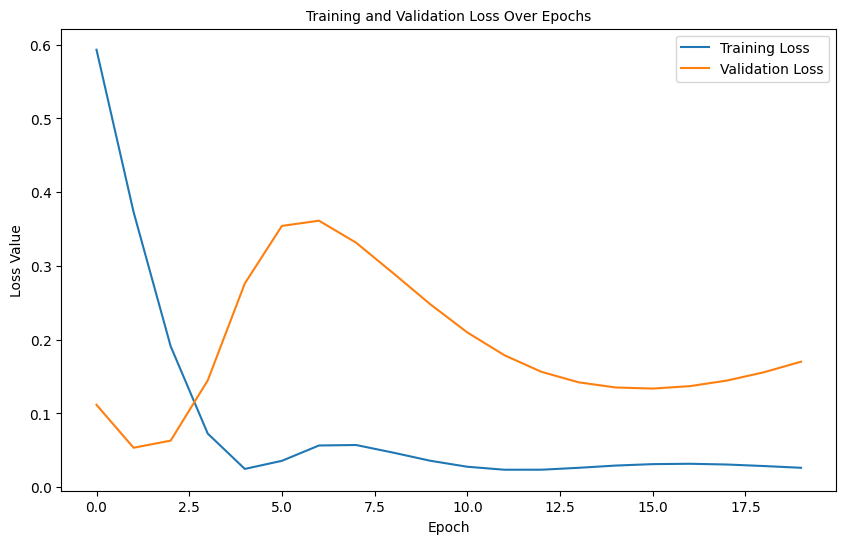

In [45]:
# Plot Training and Validation Loss
plt.figure(figsize=(10, 6))
plt.plot(range(n_epochs), train_losses, label='Training Loss')
plt.plot(range(n_epochs), val_losses, label='Validation Loss')
plt.legend(prop={'size': 10})
plt.xlabel('Epoch', size=10)
plt.ylabel('Loss Value', size=10)
plt.title('Training and Validation Loss Over Epochs', size=10)
plt.show()

Processed batch of size: 2
Current targets length: 2, Current predictions length: 2
Test Loss: 0.1701


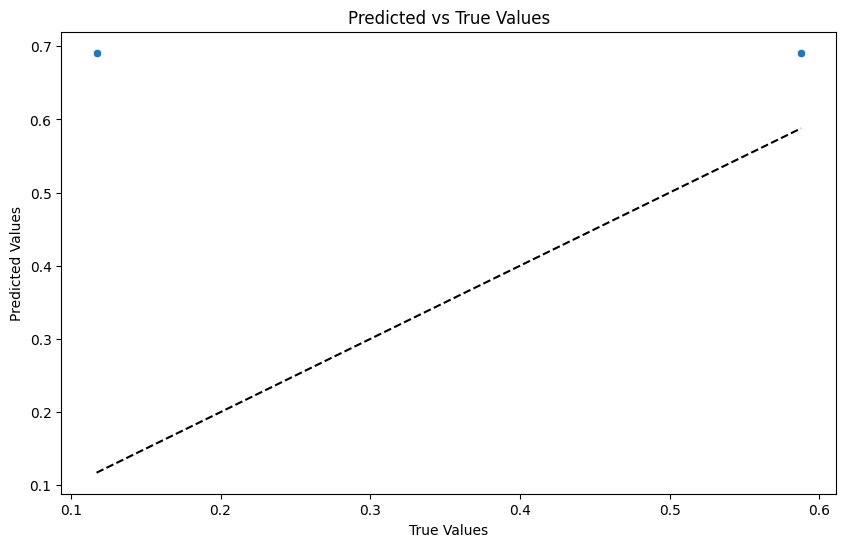

In [46]:
# Evaluation on Test Data
model.eval()
test_loss = 0.0
all_targets = []
all_predictions = []

with torch.no_grad():
    for inputs, targets in val_loader:
        # Add an additional time dimension
        inputs = inputs.unsqueeze(1)  # Adds a time dimension (time_steps = 1)
        inputs, targets = inputs.to(device), targets.to(device)

        # Forward pass
        outputs = model(inputs)
        targets = targets.view(-1, 1)  # Ensure targets have the same shape as outputs
        loss = criterion(outputs, targets)

        # Update test loss
        test_loss += loss.item() * inputs.size(0)

        # Collect targets and predictions for evaluation
        all_targets.extend(targets.cpu().numpy().flatten())
        all_predictions.extend(outputs.cpu().numpy().flatten())

        # Debugging to verify data points being processed
        print(f"Processed batch of size: {inputs.size(0)}")
        print(f"Current targets length: {len(all_targets)}, Current predictions length: {len(all_predictions)}")

# Calculate the average test loss
test_loss /= len(val_loader.dataset)
print(f'Test Loss: {test_loss:.4f}')

# Visualize Predictions vs True Values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=all_targets, y=all_predictions)
plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.plot([min(all_targets), max(all_targets)], [min(all_targets), max(all_targets)], 'k--')
plt.title("Predicted vs True Values")
plt.show()


In [47]:
print(f"Batch size during evaluation: {inputs.size(0)}")


Batch size during evaluation: 2


In [48]:
print(f"Training dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")


Training dataset size: 4
Validation dataset size: 2


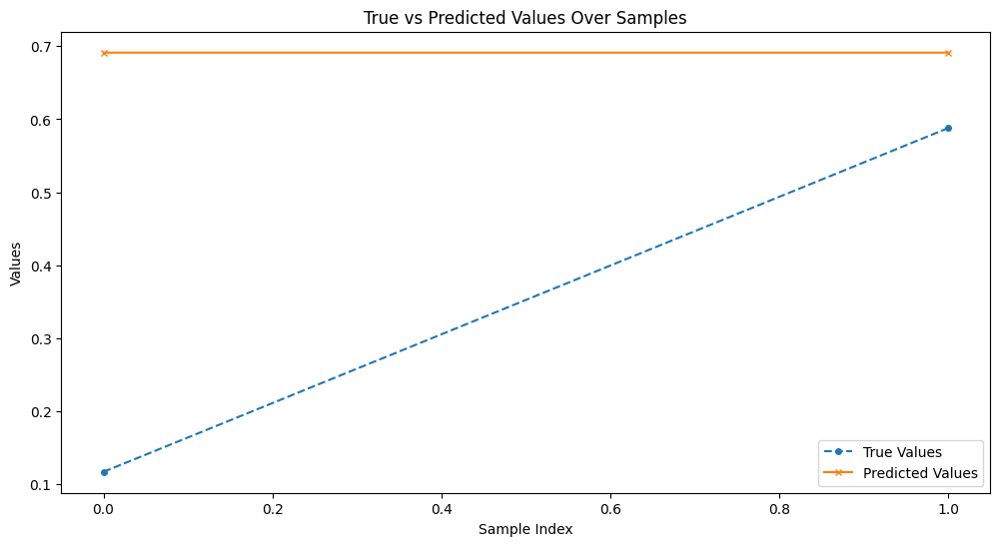

In [49]:
# Improved visualization for better comparison
plt.figure(figsize=(12, 6))
plt.plot(all_targets, label='True Values', linestyle='--', marker='o', markersize=4)
plt.plot(all_predictions, label='Predicted Values', linestyle='-', marker='x', markersize=4)
plt.xlabel("Sample Index")
plt.ylabel("Values")
plt.legend()
plt.title("True vs Predicted Values Over Samples")
plt.show()

In [50]:
# Calculate additional metrics
rmse = np.sqrt(mean_squared_error(all_targets, all_predictions))
r2 = r2_score(all_targets, all_predictions)
accuracy = (1 - (rmse / np.mean(all_targets))) * 100
print(f"RMSE: {rmse:.4f}")
print(f"R^2 Score: {r2:.4f}")
print(f"Accuracy: {accuracy:.2f}%")

RMSE: 0.4125
R^2 Score: -2.0714
Accuracy: -17.02%
